# Synchrony & Alignment
*Written by Juha Lahnakoski and Luke Chang*

## Outline
- Overview
    - questions/goals
    - assumptions
- Intersubject Correlation
- Phase Synchrony
- Dynamic Time Warping
- Alignment in latent space (SRM)

Synchrony between individuals happens at several levels from behavior to brain activity ([Nummenmaa et al., 2018](https://www.sciencedirect.com/science/article/pii/S2352250X1830023X), [Nastase et al., 2019](https://academic.oup.com/scan/article/14/6/667/5489905)). To an observer, synchrony during interaction or joint motion ([Hale et al., 2020](https://link.springer.com/article/10.1007/s10919-019-00320-3)) can reflect prosocial qualities such rapport ([Miles et al., 2009](https://www.sciencedirect.com/science/article/pii/S0022103109000328)) or affiliation ([Hove and Risen, 2009](https://pdfs.semanticscholar.org/393f/e817c4e137335dc7b8c304be5037c15e716c.pdf)). During physically arousing ritualistic experiences, observers may selectively synchronize their heart rates while observing related, but not unrelated individuals participating in the ritual ([Konvalinka et al., 2011](https://www.pnas.org/content/pnas/108/20/8514.full.pdf)) and the degree of affective synchrony can predict the perceived social connection between two individuals ([Cheong et al., 2020](https://psyarxiv.com/bd9wn)). Synchrony of brain activity is associated with, among other things, shared psychological perspectives toward a stimulus ([Lahnakoski et al., 2014](https://www.sciencedirect.com/science/article/pii/S1053811914004996), [Yeshurun et al., 2017](https://psyarxiv.com/bd9wn), [Yeshurun et al., 2017](https://journals.sagepub.com/doi/full/10.1177/0956797616682029), [Kang & Wheatley, 2017](https://europepmc.org/article/med/28383993), [Cheong et al., 2020](https://psyarxiv.com/bd9wn)) and friendship ([Parkinson et al., 2018](https://www.nature.com/articles/s41467-017-02722-7)), and may also be disturbed in psychiatric conditions ranging from developmental conditions such as autism ([Hasson et al., 2009](https://onlinelibrary.wiley.com/doi/pdf/10.1002/aur.89); [Salmi et al., 2013](https://www.sciencedirect.com/science/article/pii/S2213158213001411), [Byrge et al., 2015](https://www.jneurosci.org/content/35/14/5837.short)) to more acute conditions such as first-episode psychosis ([Mäntylä et al., 2018](https://www.sciencedirect.com/science/article/pii/S0006322318314690)). Thus, measures of synchrony can offer a simple window to many psychological processes.

In brain imaging, synchrony of brain activity is most commonly measured using intersubject correlations (ISC; [Hasson et al., 2004](https://science.sciencemag.org/content/sci/303/5664/1634.full.pdf)). As the name implies, this method calculates linear correlations between participants and derives summary statistics from these correlations to measure the level of similarity of brain activity. Overall, the brain activity measured with fMRI during naturalistic stimulation conditions can be thought to consist of four main sources: (1) *stimulus-driven brain activity* between individuals shared by all or most of the participants, (2) individual or *idiosyncratic activity* elicited by the stimulus, (3) *intrinsic activity* that is not time-locked to the stimulus, and (4) *noise* from various sources. The idea behind ISC is to identify brain activity that is shared by a large proportion of the participants (category 1). Thus, this method evaluates how much of an individual’s brain activity is explained by this shared component. By contrast, if smaller groups of participants, e.g. pairs of friends within the study, share similar individual activity patterns (category 2), it may be better captured by the dyadic values in the pairwise matrices using techniques such as IS-RSA ([Parkinson et al., 2018](https://www.nature.com/articles/s41467-017-02722-7), [Chen et al., 2020](https://www.sciencedirect.com/science/article/pii/S1053811920303372), [Finn et al., 2020](https://www.sciencedirect.com/science/article/pii/S1053811920303153)). Generally, the third category of activity is not readily detected by synchrony approaches ([Chang et al., 2018](https://www.biorxiv.org/content/10.1101/487892v1.abstract)). However, with inventive experimental designs, e.g. during verbal recall of previously experienced stimuli ([Chen et al., 2017](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5191958/)), it is still possible to extract shared brain activity patterns by temporally reorganizing the data, even when the original experiences of the participants were out of sync. The optimal choice of analysis will depend on the research question and the type of shared activity patterns that are of particular interest. Most commonly, ISCs are calculated locally within each voxel (or region), but this approach has also been extended to functional connectivity ([Simony et al., 2016](https://www.nature.com/articles/ncomms12141)). Intersubject correlations give a summary statistic of synchrony over long periods of time, usually over an entire imaging session. However, the level of synchrony may change considerably from one moment to the next with the experimental condition and can be investigated using time-varying measures of synchrony.

In this tutorial, we will cover:
- how to compute pairwise ISC
- how to perform hypothesis tests with ISC
- how to perform ISFC (also see the [Dynamic Connectivity](http://naturalistic-data.org/features/notebooks/timecorr.html) tutorial)
- how to perform dynamic ISC

Let's get started by watching some short videos illustrating how ISC can be used with naturalistic data.

[Dr. Yaara Yeshurun, PhD](https://people.socsci.tau.ac.il/mu/yaarayeshurun/), an Assistant Professor at Tel-Aviv University, will provide two example applications of how ISC can be used to characterize the brain mechanisms underlying shared understanding.

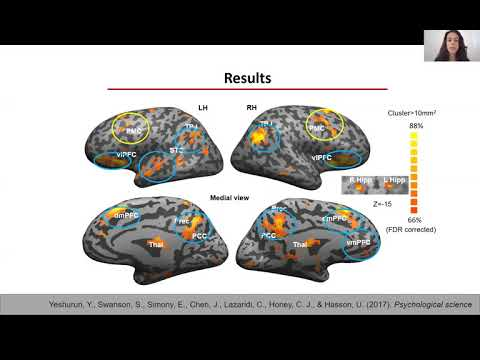

In [4]:
from IPython.display import YouTubeVideo

YouTubeVideo('pvYNjG1jvQE')

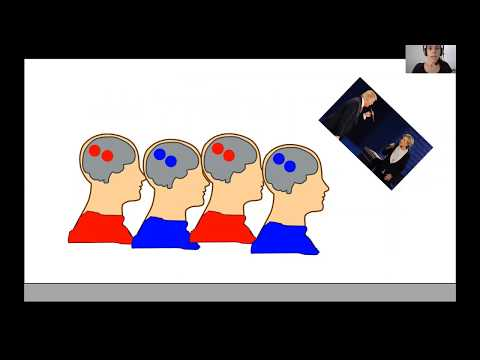

In [5]:
YouTubeVideo('wEKKTG7Q1DQ')

## Computing Intersubject Correlation
### Pairwise vs Average Response
Generally, ISCs are calculated using one of two main approaches. First, one calculates **pairwise** correlations between all participant pairs to build a full intersubject correlation matrix. The second approach, uses the **average** activity timecourse of the other participants as a model for each individual left out participant. This procedure produces individual, rather than pairwise, spatial maps of similarity reflecting how similarly, or “typically”, each person’s brain activates. These maps lend themselves to similar analyses as one might perform with first level results of a traditional general linear model (GLM) analysis. However, some of the individual variability is lost with the latter approach, and thus the ISC values are typically of much higher magnitude compared to the pairwise matrices. 

### Summary Statistic
The next step after computing either the pairwise or average similarity across participants is to summarize the overall level of synchrony across participants. A straightforward approach is to compute the **mean** correlation. However, to make the correlation coefficients more normally distributed across the range of values, the Fisher’s Z transformation (inverse hyperbolic tangent) is typically applied before computing the mean correlation. The Fisher’s Z transformation mainly affects the higher end of absolute correlation values, eventually stretching the correlation coefficient 1 to infinity. However, with the typical range of values of pairwise ISCs, the effects of this transformation are relatively small reaching ~10% at the higher end of the scale of r=0.5. More recently, it has been suggested that computing the **median**, particularly when using the pairwise approach, provides a more accurate summary of the correlation values ([Chen et al., 2016](https://www.sciencedirect.com/science/article/pii/S1053811916301331)).

### Hypothesis tests
Performing hypothesis tests that appropriately account for the false positive rate can be tricky with ISC because of the dependence between the pairwise correlation values and the inflated number of variables in the pairwise correlation matrices. Though there have been proposals to use mixed-effects models for a parametric solution ([Chen et al., 2017](https://www.sciencedirect.com/science/article/pii/S1053811916304141)), we generally recommend using non-parametric statistics when evaluating the significance of these correlations. 

There are two general non-parametric approaches to performing hypothesis tests with ISC. The first method is a *permutation* or randomization method, achieved by creating surrogate data and repeating the same analysis many times to build an empirical null distribution (e.g. 5-10k iterations). However, to meet the exchangeability assumption, it is important to consider the temporal dependence structure. Surrogate data can be created by **circularly shifting** the timecourses of the participants, or **scrambling the phases** of the Fourier transform of the signals and transforming these scrambled signals back to the time domain ([Theiler et al., 1992](https://www.sciencedirect.com/science/article/pii/016727899290102S), [Lancaster et al., 2018](https://www.sciencedirect.com/science/article/pii/S0370157318301340)). Various blockwise scrambling techniques have also been applied and autoregressive models have been proposed to create artificial data for statistical inference . These approaches have the benefit that, when properly designed, they retain important characteristics of the original signal, such as the frequency content and autocorrelation, while removing temporal synchrony in the data. 

To illustrate these permutation based approaches, the animation below depicts the process of creating these null distributions and compares these to a similar distribution built based on real resting state data of the same duration in the same participants recorded just prior to the movie data in the same imaging study. Resting state is an ideal condition for demonstrating the true null distribution of no synchrony intersubject correlation as it involves no external synchronizing factors apart from the repeating noise of the scanner gradients, which are generally not of interest to us. Thus, any correlations in the resting state data arise by chance. As can be seen, the null distributions based on the surrogate data follow the distribution of resting state ISCs well as the number of iterations increases. However, the distributions are sometimes considered too liberal.

![null_distribution](../images/isc/NullMethodsVsMovieAndRest.gif)

The second approach employs a *subject-wise bootstrap* on the pairwise similarity matrices. Essentially, participants are randomly sampled with replacement and then a new similarity matrix is computed with these resampled participants. As a consequence of the resampling procedure, sometimes the same subjects are sampled multiple times, which introduces correlation values of 1 off the diagonal. Summarizing the ISC using the median can minimize the impact of these outliers. These values are then shifted by the real summary statistics to produce an approximately zero-centered distribution. Python implementations in Brainiak and nltools convert these values to NaNs by default so that they are not included in the overall ISC summary statistic. If you would like to learn more about resampling methods, we encourage you to read our [brief introduction](https://dartbrains.org/features/notebooks/15_Resampling_Statistics.html) available on the dartbrains course.

## Getting Started
Before getting started with this tutorial, we need to make sure you have the necessary software installed and data downloaded.

### Software
This tutorial requires the following Python packages to be installed. See the [Software Installation](http://naturalistic-data.org/features/notebooks/Software.html) tutorial for more information.

- seaborn
- matplotlib
- numpy
- scipy
- pandas
- nltools
- nilearn
- sklearn
- networkx
- datalad

Let's now load the modules we will be using for this tutorial.

In [125]:
%matplotlib inline

import os
from tqdm.notebook import tqdm
import glob
import numpy as np
from numpy.fft import fft, ifft, fftfreq
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.animation import FuncAnimation
import seaborn as sns
from nltools.data import Brain_Data, Adjacency
from nltools.mask import expand_mask, roi_to_brain
from nltools.stats import isc, isc_group, isfc, isps, fdr, threshold, phase_randomize, circle_shift, _butter_bandpass_filter, _phase_mean_angle, _phase_vector_length, zscore
from nilearn.plotting import view_img_on_surf, view_img
from sklearn.metrics import pairwise_distances
from sklearn.utils import check_random_state
from scipy.stats import ttest_1samp
from scipy.signal import hilbert
import networkx as nx
from IPython.display import HTML
from fnl_tools.utils import rec_to_time

from nltools.mask import create_sphere, expand_mask
from nltools.data import Brain_Data, Adjacency
from nltools.stats import align
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from nilearn.plotting import plot_stat_map
import datalad.api as dl
import warnings

warnings.simplefilter('ignore')

# import nest_asyncio
# nest_asyncio.apply()
import datalad.api as dl


### Data
This tutorial will be using the **Sherlock** dataset and will require downloading the Average ROI **csv** files.

We have already extracted the data for you to make this easier and have written out the average activity within each ROI into a separate csv file for each participant. If you would like to get practice doing this yourself, here is the code we used. Note that we are working with the hdf5 files as they load much faster than the nifti images, but either one will work for this example.

``` python
for scan in ['Part1', 'Part2']:
    file_list = glob.glob(os.path.join(data_dir, 'fmriprep', '*', 'func', f'*crop*{scan}*hdf5'))
    for f in file_list:
        sub = os.path.basename(f).split('_')[0]
        print(sub)
        data = Brain_Data(f)
        roi = data.extract_roi(mask)
        pd.DataFrame(roi.T).to_csv(os.path.join(os.path.dirname(f), f"{sub}_{scan}_Average_ROI_n50.csv" ), index=False)
```

You will want to change `data_dir` to wherever you have installed the Sherlock datalad repository. We will initialize a datalad dataset instance and get the files we need for this tutorial. If you've already downloaded everything, you can skip this cell. See the [Download Data Tutorial](http://naturalistic-data.org/features/notebooks/Download_Data.html) for more information about how to install and use datalad.

In [16]:
data_dir = '/Users/lukechang/Downloads/FNL'

# If dataset hasn't been installed, clone from GIN repository
if not os.path.exists(data_dir):
    dl.clone(source='https://github.com/OpenNeuroDatasets/ds003521.git', path=data_dir)

# Initialize dataset
ds = dl.Dataset(data_dir)

# Get Cropped & Denoised CSV Files
# result = ds.get(glob.glob(os.path.join(data_dir, 'derivatives', 'denoised', 'smoothed', f'*average_roi.csv')))

[INFO] Attempting a clone into /Users/lukechang/Downloads/FNL 
[INFO] Attempting to clone from https://github.com/OpenNeuroDatasets/ds003521.git to /Users/lukechang/Downloads/FNL 
[INFO] Start enumerating objects 
[INFO] Start counting objects 
[INFO] Start compressing objects 
[INFO] Start receiving objects 
[INFO] Start resolving deltas 
[INFO] Completed clone attempts for Dataset(/Users/lukechang/Downloads/FNL) 
[INFO] Remote origin not usable by git-annex; setting annex-ignore 
[INFO] https://github.com/OpenNeuroDatasets/ds003521.git/config download failed: Not Found 
[INFO] access to 1 dataset sibling s3-PRIVATE not auto-enabled, enable with:
| 		datalad siblings -d "/Users/lukechang/Downloads/FNL" enable -s s3-PRIVATE 


install(ok): /Users/lukechang/Downloads/FNL (dataset)


### Download ROI Data from github

In [12]:
sub_list = ['sub-sid000705',
 'sub-sid000708',
 'sub-sid000707',
 'sub-sid000678',
 'sub-sid000677',
 'sub-sid000475',
 'sub-sid000375',
 'sub-sid000681',
 'sub-sid000683',
 'sub-sid000498',
 'sub-sid000697',
 'sub-sid000698',
 'sub-sid000695',
 'sub-sid000692',
 'sub-sid000216',
 'sub-sid000570',
 'sub-sid000669',
 'sub-sid000688',
 'sub-sid000668',
 'sub-sid000573',
 'sub-sid000667',
 'sub-sid000671',
 'sub-sid000217',
 'sub-sid000529',
 'sub-sid000679',
 'sub-sid000476',
 'sub-sid000704',
 'sub-sid000706',
 'sub-sid000710',
 'sub-sid000680',
 'sub-sid000682',
 'sub-sid000494',
 'sub-sid000694',
 'sub-sid000699']

    
sub_timeseries = {}
for sub in tqdm(sub_list):
    sub_data = pd.read_csv(f'https://raw.githubusercontent.com/mind-tutorials/mind_book/master/data/fnl_average_roi/{sub}_task-movie_run-1_space-MNI152NLin2009cAsym_desc-preproc_trim_smooth6_denoised_average_roi.csv')
    sub_timeseries[sub] = sub_data


  0%|          | 0/34 [00:00<?, ?it/s]

In [14]:
sub_timeseries['sub-sid000699']

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-2.025469,-1.491564,-1.691733,-0.103308,-6.286235,-1.023197,-0.894111,-2.320273,-1.219740,0.402330,...,-1.141991,-0.882169,1.359163,-3.292576,-1.013189,-0.211746,0.077613,-1.092454,1.231955,-2.031632
1,-2.442710,-1.510920,-1.883794,-0.901486,-6.458607,-2.977494,-2.440530,-1.528198,-0.942645,-1.446406,...,-0.771338,-2.272298,0.319252,-4.922652,-0.458386,-2.333010,-0.856699,-0.645008,0.587006,-2.740077
2,-1.284763,0.156858,-1.965230,1.151626,-4.715424,-1.621241,-0.615399,1.482972,-0.146937,0.025991,...,0.799982,-1.593317,1.692602,-3.433023,0.819542,-1.260936,0.380680,-0.106569,1.714205,-2.764208
3,0.536110,0.648213,-1.078426,-0.111095,-2.998630,-0.677310,1.093469,0.710973,-0.588759,-0.869338,...,-0.138236,-0.415700,1.735143,-2.449204,0.451625,-1.121662,1.700084,-0.036604,0.990159,-1.475510
4,0.264788,0.383346,-1.072950,1.121433,-0.487104,-0.890594,1.463078,0.801892,0.161128,-0.977986,...,0.519097,-0.269372,0.443903,0.205150,0.084727,-1.438526,0.858222,-0.634892,-0.269205,-1.624712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1359,1.609093,-1.299798,0.268150,-1.323970,-8.522200,-1.977410,-1.188960,-1.219553,-1.056089,-1.896866,...,-1.749647,-1.397383,-1.049484,-7.655202,-0.452800,-0.676843,-1.143168,-0.741588,-1.044792,-0.173350
1360,1.791656,-0.183720,0.451022,-1.922403,-8.125236,-2.474647,-0.530276,0.361526,-0.950302,-2.106751,...,-0.643133,-1.708939,-0.746690,-7.830381,-0.037564,-0.810639,-3.008373,-1.290913,-1.405284,-0.498656
1361,2.343590,1.254490,0.330810,-0.486032,-7.815416,-0.487432,1.182788,1.600578,-0.072406,0.055318,...,1.171472,-1.296824,0.127939,-4.660187,1.201917,0.562617,-2.109916,-0.911636,-0.467327,-0.068788
1362,2.656586,0.420821,-0.127660,-1.796128,-7.570929,0.278685,0.756152,0.440722,-0.667067,0.340894,...,0.005350,-2.156855,-0.190335,-3.987582,1.378076,1.432340,-2.518401,-1.975942,-0.592266,0.027708


#### Create ROIs to use for tutorial
Can remove this

In [ ]:
import os

download_path = '/Users/lukechang/Downloads/FridayNightLights'

if not os.path.exists(download_path):
    os.makedirs(download_path)

%cd {download_path}

!datalad install https://github.com/OpenNeuroDatasets/ds003521.git

In [29]:
mask = Brain_Data('http://neurovault.org/media/images/2099/Neurosynth%20Parcellation_0.nii.gz')

file_list = glob.glob(os.path.join(download_path, 'ds003521', 'derivatives', 'denoised', 'smoothed', '*hdf5'))
for f in tqdm(file_list):
    sub_dat = Brain_Data(f)
    sub_roi = sub_dat.extract_roi(mask)
    sub_roi = pd.DataFrame(sub_roi).T
    output_name = f"{os.path.basename(f).split('_bold.hdf5')[0]}_average_roi.csv"
    sub_roi.to_csv(os.path.join(download_path, 'ds003521', 'derivatives', 'denoised', 'smoothed', output_name), index=False)

  0%|          | 0/34 [00:00<?, ?it/s]

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)
/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)
/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)
/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)
/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header

## ISC Analysis Tutorial
Ok, now let's see how ISC works with real data. In this tutorial, we will be computing ISC on average activity within 50 ROIs using data from the Sherlock dataset using the nltools Python toolbox. We also recommend checking out the Brainiak [tutorial](https://brainiak.org/tutorials/10-isc/), and the Matlab [ISC-Toolbox](https://www.nitrc.org/projects/isc-toolbox/) ([Kauppi et al., 2014](http://www.frontiersin.org/neuroinformatics/10.3389/fninf.2014.00002/abstract)).

Ok, now let's download the k=50 whole brain meta-analytic parcellation of the neurosynth database ([de la Vega, 2016](https://www.jneurosci.org/content/36/24/6553?utm_source=TrendMD&utm_medium=cpc&utm_campaign=JNeurosci_TrendMD_0)) from [neurovault](https://neurovault.org/collections/2099/). Each ROI is indicated with a unique integer. We can expand this mask into 50 separate binary masks with the `expand_mask` function.

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)


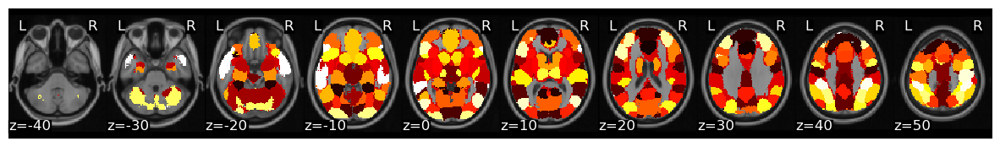

In [18]:
mask = Brain_Data('http://neurovault.org/media/images/2099/Neurosynth%20Parcellation_0.nii.gz')
mask_x = expand_mask(mask)

mask.plot()

Now, let's load the csv files for each participant. Remember, Sherlock viewing was separated into two 25 minute runs. We will need to combine these separately for each participant. There are many different ways to do this step. In this example, we will be storing everything in a dictionary.

Now, let's pick a single ROI to demonstrate how to perform ISC analyses. We can pick any region, but let's start with the vmPFC (roi=32), feel free to play with different regions as you work with the code.

We can plot the mask and create a new pandas DataFrame that has the average vmPFC activity for each participant.

,sub-sid000705,sub-sid000708,sub-sid000707,sub-sid000678,sub-sid000677,sub-sid000475,sub-sid000375,sub-sid000681,sub-sid000683,sub-sid000498,...,sub-sid000679,sub-sid000476,sub-sid000704,sub-sid000706,sub-sid000710,sub-sid000680,sub-sid000682,sub-sid000494,sub-sid000694,sub-sid000699
0,-1.526843,-0.822133,0.078612,-1.943734,0.032419,3.522833,-1.608605,0.557268,-1.090106,-1.361836,...,-1.689677,-2.191803,0.715140,-0.689399,1.699899,-1.677815,0.657649,-3.639095e+00,-1.214422,-0.952538
1,-0.403558,-1.892190,-1.251197,0.912629,-0.667367,3.740902,-2.695687,-0.416134,-1.442743,-2.187754,...,-1.528878,-1.911664,0.123302,-2.099036,0.356507,-1.959084,0.842592,-1.608288e-12,-0.727031,-2.480802
2,0.970192,-2.490192,-0.754759,0.859470,0.568355,2.698349,-1.308705,-0.494827,-2.356511,-1.597542,...,0.282604,-1.343017,1.313281,-0.872074,1.233258,-1.810902,1.139573,-3.500544e-12,0.869101,-2.362277
3,0.693722,-0.982873,-0.258273,-0.839349,1.420314,4.683980,-1.196624,1.145990,-1.998290,-0.566808,...,0.270224,-1.271051,1.417756,-0.694939,2.580860,0.281092,1.201584,2.790793e-12,1.637060,0.042928
4,-1.379905,0.522651,0.862991,-0.083031,1.705664,4.646459,0.177413,0.856953,-3.593954,1.770211,...,1.589096,-0.677654,2.998380,-0.401869,0.692325,-0.879314,-0.297919,-5.598586e-13,1.495458,-0.899801


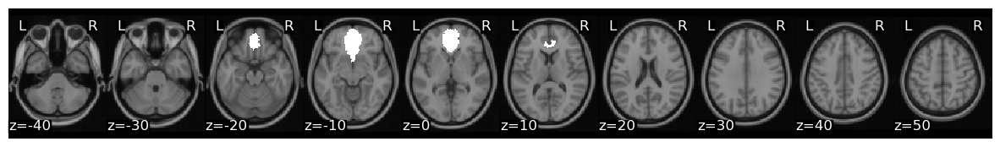

In [19]:
roi = 32

mask_x[roi].plot()

def get_subject_roi(data, roi):
    sub_rois = {}
    for sub in data:
        sub_rois[sub] = data[sub].iloc[:, roi]
    return pd.DataFrame(sub_rois)

sub_rois = get_subject_roi(sub_timeseries, roi)
sub_rois.head()

### Circle Shift Randomization
To perform ISC we will be using the `nltools.stats.isc` function. There are three different methods implemented to perform hypothesis tests (i.e., circular shifting data, phase randomization, and subject-wise bootstrap). We will walk through an example of how to run each one.

The idea behind circular shifting the data is to generate random surrogate data that has the same autoregressive and temporal properties of the original data ([Lancaster et al., 2018](https://www.sciencedirect.com/science/article/pii/S0370157318301340)). This is fairly straightforward and involves randomly selecting a time point to become the new beginning of the timeseries and then concatenating the rest of the data at the end so that it has the same length as the original data. Of course, there will potentially be a sudden change in the data where the two parts were merged.

To demonstrate how this works and that the circular shifted data has the same spectral properties of the original data, we will plot one subject's time series and shift it using the `nltools.stats.circle_shift` function. Next to both timeseries we plot the coefficients from a fast fourier transform.

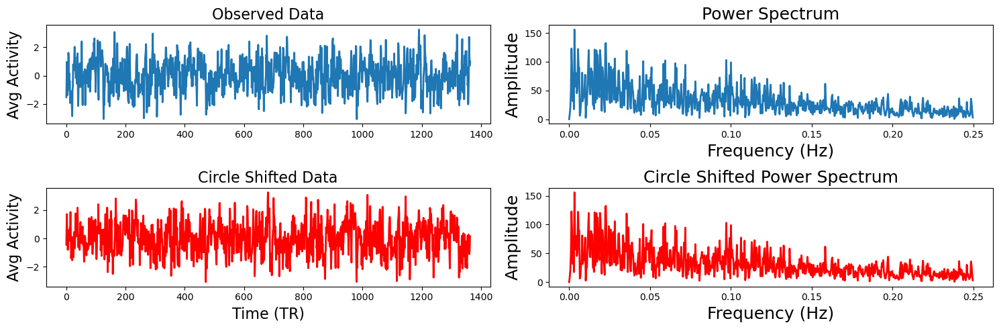

In [22]:
sub = sub_list[0]
sampling_freq = .5

f,a = plt.subplots(nrows=2, ncols=2, figsize=(15, 5))
a[0,0].plot(sub_rois[sub], linewidth=2)
a[0,0].set_ylabel('Avg Activity', fontsize=16)
a[0,1].set_xlabel('Time (TR)', fontsize=18)
a[0,0].set_title('Observed Data', fontsize=16)

fft_data = fft(sub_rois[sub])
freq = fftfreq(len(fft_data), 1/sampling_freq)
n_freq = int(np.floor(len(fft_data)/2))
a[0,1].plot(freq[:n_freq], np.abs(fft_data)[:n_freq], linewidth=2)
a[0,1].set_xlabel('Frequency (Hz)', fontsize=18)
a[0,1].set_ylabel('Amplitude', fontsize=18)
a[0,1].set_title('Power Spectrum', fontsize=18)

circle_shift_data = circle_shift(sub_rois[sub])
a[1,0].plot(circle_shift_data, linewidth=2, color='red')
a[1,0].set_ylabel('Avg Activity', fontsize=16)
a[1,0].set_xlabel('Time (TR)', fontsize=16)
a[1,0].set_title('Circle Shifted Data', fontsize=16)

fft_circle = fft(circle_shift_data)
a[1,1].plot(freq[:n_freq], np.abs(fft_circle)[:n_freq], linewidth=2, color='red')
a[1,1].set_xlabel('Frequency (Hz)', fontsize=18)
a[1,1].set_ylabel('Amplitude', fontsize=18)
a[1,1].set_title('Circle Shifted Power Spectrum', fontsize=18)

plt.tight_layout()

Now that you understand how the circular shifting method works with a single time series, let's compute the ISC of the Sherlock viewing data within the vmPFC roi with 5000 permutations. The function outputs a dictionary that contains the ISC values, the p-value, the 95% confidence intervals, and optionally returns the 5000 samples. All of the permutation and bootstraps are parallelized and will use as many cores as your computer has available.

In [23]:
stats_circle = isc(sub_rois, method='circle_shift', n_samples=5000, return_null=True)

print(f"ISC: {stats_circle['isc']:.02}, p = {stats_circle['p']:.03}")

ISC: 0.071, p = 0.0002


### Phase Randomization
Next we will show how phase randomization works. This method projects the data into frequency space using a fast fourier transform and randomizes the phase and then projects the data back into the time domain ([Theiler et al., 1992](https://www.sciencedirect.com/science/article/pii/016727899290102S), [Lancaster et al., 2018](https://www.sciencedirect.com/science/article/pii/S0370157318301340)). Similar to the circular shifting method, this generates a random surrogate of the data, while maintaining a similar temporal and autoregressive structure as the original data. We will generate the same plots from the example above to illustrate how this works using the `nltools.stats.phase_randomize` function.

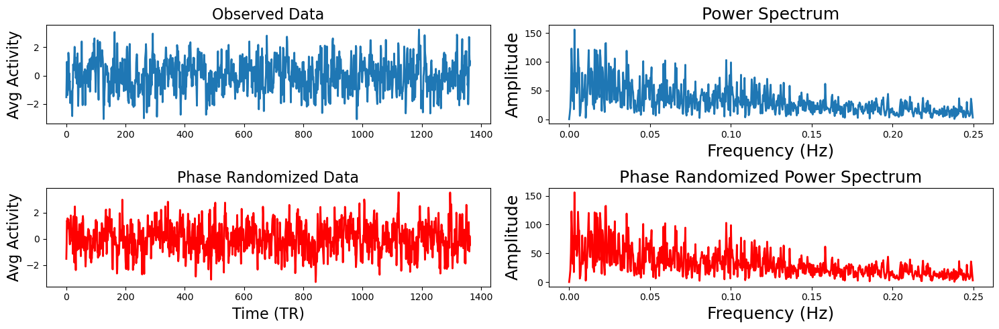

In [26]:
sub = sub_list[0]
sampling_freq = .5

f,a = plt.subplots(nrows=2, ncols=2, figsize=(15, 5))
a[0,0].plot(sub_rois[sub], linewidth=2)
a[0,0].set_ylabel('Avg Activity', fontsize=16)
a[0,1].set_xlabel('Time (TR)', fontsize=18)
a[0,0].set_title('Observed Data', fontsize=16)

fft_data = fft(sub_rois[sub])
freq = fftfreq(len(fft_data), 1/sampling_freq)
n_freq = int(np.floor(len(fft_data)/2))
a[0,1].plot(freq[:n_freq], np.abs(fft_data)[:n_freq], linewidth=2)
a[0,1].set_xlabel('Frequency (Hz)', fontsize=18)
a[0,1].set_ylabel('Amplitude', fontsize=18)
a[0,1].set_title('Power Spectrum', fontsize=18)

phase_random_data = phase_randomize(sub_rois[sub])
a[1,0].plot(phase_random_data, linewidth=2, color='red')
a[1,0].set_ylabel('Avg Activity', fontsize=16)
a[1,0].set_xlabel('Time (TR)', fontsize=16)
a[1,0].set_title('Phase Randomized Data', fontsize=16)

fft_phase = fft(phase_random_data)
a[1,1].plot(freq[:n_freq], np.abs(fft_phase)[:n_freq], linewidth=2, color='red')
a[1,1].set_xlabel('Frequency (Hz)', fontsize=18)
a[1,1].set_ylabel('Amplitude', fontsize=18)
a[1,1].set_title('Phase Randomized Power Spectrum', fontsize=18)

plt.tight_layout()

In [27]:
stats_phase = isc(sub_rois, method='phase_randomize', n_samples=5000, return_null=True)

print(f"ISC: {stats_phase['isc']:.02}, p = {stats_phase['p']:.03}")

ISC: 0.071, p = 0.0002


As you can see the ISC value is identical as the median of the pairwise correlations are identical. The p-values are also similar and likely reflect the limited precision of the possible p-values that can be computed using only 5,000 permutations. For greater precision, you will need to increase the number of permutations, but remember that this will also increase the computational time. 

### Subject-wise Bootstrapping
The final approach we will illustrate is subject-wise bootstrapping of the pairwise similarity matrix. This approach is more conservative than the previously described methods and is almost an order of magnitude faster shuffling the similarity matrix rather than recomputing the pairwise similarity for the null distribution ([Chen et al., 2016](https://www.sciencedirect.com/science/article/pii/S1053811916301331)). Bootstrapping and permutation tests are different types of resampling statistics (see our resampling [tutorial](https://dartbrains.org/features/notebooks/15_Resampling_Statistics.html) for a more in depth overview). Bootstrapping is typically used more for generating confidence intervals around an estimator, while permutation tests are used for performing hypothesis tests. However, p-values can also be computed using a bootstrap by subtracting the ISC from the null distribution and evaluating the percent of samples from the distribution that are smaller than the observed ISC ([Hall et al., 1991](https://www.jstor.org/stable/2532163#metadata_info_tab_contents)).

Just like the examples above, we will illustrate what an example bootstrapped similarity matrix looks like. Notice how some subjects are repeatedly resampled, which means that there are multiple values of perfect correlations found off the diagonal. This should be accounted for by using the **median** summary statistic of the lower triangle. However, both Brainiak and nltools toolboxes convert these values to NaNs to minimize the impact of these outliers on the summary statistic.

Text(0.5, 1.0, 'Bootstrapped Pairwise Similarity')

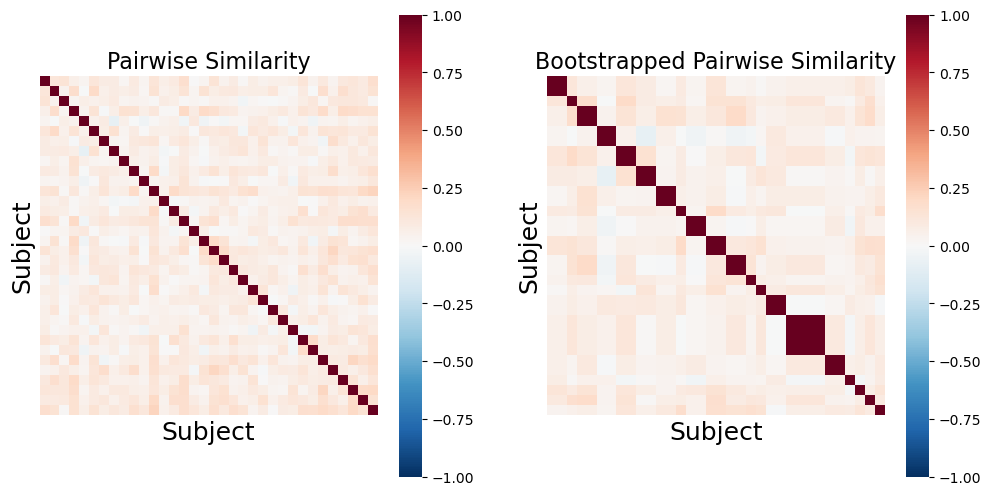

In [28]:
def bootstrap_subject_matrix(similarity_matrix, random_state=None):
    '''This function shuffles subjects within a similarity matrix based on recommendation by Chen et al., 2016'''
    
    random_state = check_random_state(random_state)
    n_sub = similarity_matrix.shape[0]
    bootstrap_subject = sorted(random_state.choice(np.arange(n_sub), size=n_sub, replace=True))
    return similarity_matrix[bootstrap_subject, :][:, bootstrap_subject]


similarity = 1 - pairwise_distances(pd.DataFrame(sub_rois).T, metric='correlation')

f,a = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)
sns.heatmap(similarity, square=True, cmap='RdBu_r', vmin=-1, vmax=1, xticklabels=False, yticklabels=False, ax=a[0])
a[0].set_ylabel('Subject', fontsize=18)
a[0].set_xlabel('Subject', fontsize=18)
a[0].set_title('Pairwise Similarity', fontsize=16)

sns.heatmap(bootstrap_subject_matrix(similarity), square=True, cmap='RdBu_r', vmin=-1, vmax=1, xticklabels=False, yticklabels=False, ax=a[1])
a[1].set_ylabel('Subject', fontsize=18)
a[1].set_xlabel('Subject', fontsize=18)
a[1].set_title('Bootstrapped Pairwise Similarity', fontsize=16)

In [29]:
stats_boot = isc(sub_rois, method='bootstrap', n_samples=5000, return_null=True)

print(f"ISC: {stats_boot['isc']:.02}, p = {stats_boot['p']:.03}")

ISC: 0.071, p = 0.0002


The bootstrap procedure tends to run much faster than the permutation methods on our computer, which is one of the reasons that the authors of the toolbox recommend this approach, beyond it being more conservative ([Chen et al., 2016](https://www.sciencedirect.com/science/article/pii/S1053811916301331)).

### Null Distributions
Since each of our examples saved the null distribution, we can plot a histogram of the null distribution from each method including the confidence intervals. Notice that the circle shift and phase randomization methods produce highly similar null distributions and confidence intervals, while the bootstrap method has a wider and less symmetric distribution with the current number of iterations. However, the observed ISC of 0.074 (red line) exceeds all of the samples from the null distribution yielding a very small p-value. Notice that our observed null distributions using the surrogate data derived from the Sherlock data are very similar to the animation of null data presented above.


/var/folders/5b/m183lc3x27n9krrzz85z2x1c0000gn/T/ipykernel_75721/3919566609.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(stats_boot['null_distribution'] - stats_boot['isc'], kde=False, label='Bootstrap')
/var/folders/5b/m183lc3x27n9krrzz85z2x1c0000gn/T/ipykernel_75721/3919566609.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de4414

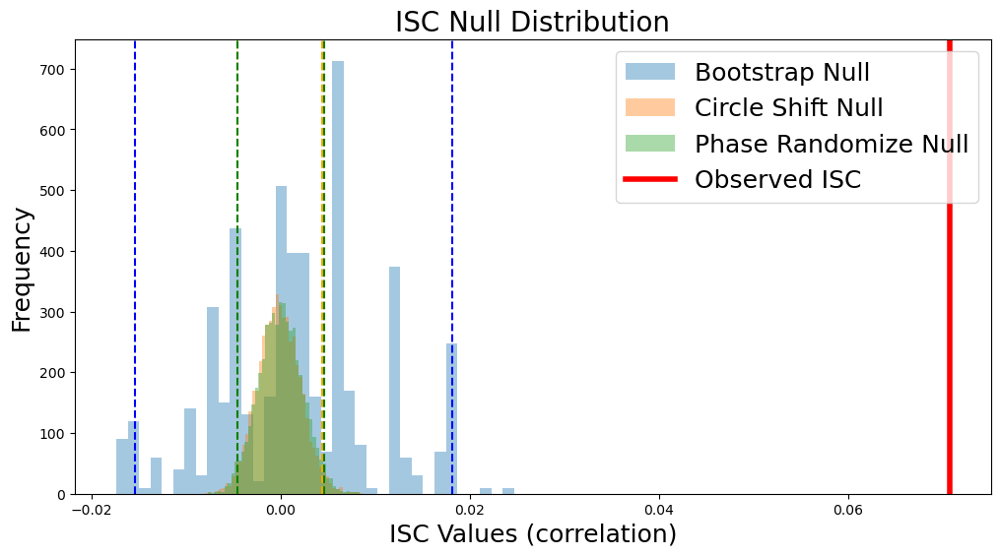

In [30]:
plt.figure(figsize=(12,6))
sns.distplot(stats_boot['null_distribution'] - stats_boot['isc'], kde=False, label='Bootstrap')
sns.distplot(stats_circle['null_distribution'], kde=False, label='Bootstrap')
sns.distplot(stats_phase['null_distribution'], kde=False, label='Bootstrap')
plt.ylabel('Frequency', fontsize=18)
plt.xlabel('ISC Values (correlation)', fontsize=18)
plt.title('ISC Null Distribution', fontsize=20)
plt.axvline(stats_boot['isc'], linestyle='-', color='red', linewidth=4)
plt.legend(['Bootstrap Null','Circle Shift Null', 'Phase Randomize Null','Observed ISC'], fontsize=18)

plt.axvline(stats_boot['ci'][0] - stats_boot['isc'], linestyle='--', color='blue')
plt.axvline(stats_boot['ci'][1] - stats_boot['isc'], linestyle='--', color='blue')

plt.axvline(stats_circle['ci'][0], linestyle='--', color='orange')
plt.axvline(stats_circle['ci'][1], linestyle='--', color='orange')

plt.axvline(stats_phase['ci'][0], linestyle='--', color='green')
plt.axvline(stats_phase['ci'][1], linestyle='--', color='green')

### Whole brain ISC
Now, let's calculate ISC looping over each of the 50 ROIs from the whole-brain meta-analytic parcellation ([de la Vega, 2016](https://www.jneurosci.org/content/36/24/6553?utm_source=TrendMD&utm_medium=cpc&utm_campaign=JNeurosci_TrendMD_0)). Here we loop over each ROI and grab the column from each subject's dataframe. We then run ISC on the combined subject's ROI timeseries using the median method and compute a hypothesis test using the subject-wise bootstrap method with 5000 samples ([Chen et al., 2016](https://www.sciencedirect.com/science/article/pii/S1053811916301331)). Finally, we convert each correlation and p-value from each region back into a Brain_Data instance.

In [31]:
isc_r, isc_p = {}, {}
for roi in range(len(mask_x)):
    stats = isc(get_subject_roi(sub_timeseries, roi), n_samples=5000, metric='median', method='bootstrap')
    isc_r[roi], isc_p[roi] = stats['isc'], stats['p']
isc_r_brain, isc_p_brain = roi_to_brain(pd.Series(isc_r), mask_x), roi_to_brain(pd.Series(isc_p), mask_x)

Now we can plot the ISC values to visualize which regions had a higher overall ISC.

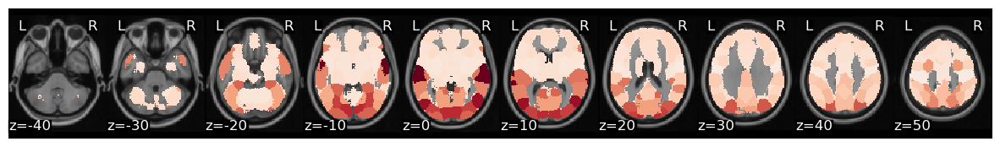

In [32]:
isc_r_brain.plot(cmap='RdBu_r')

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/plotting/html_stat_map.py:217: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()



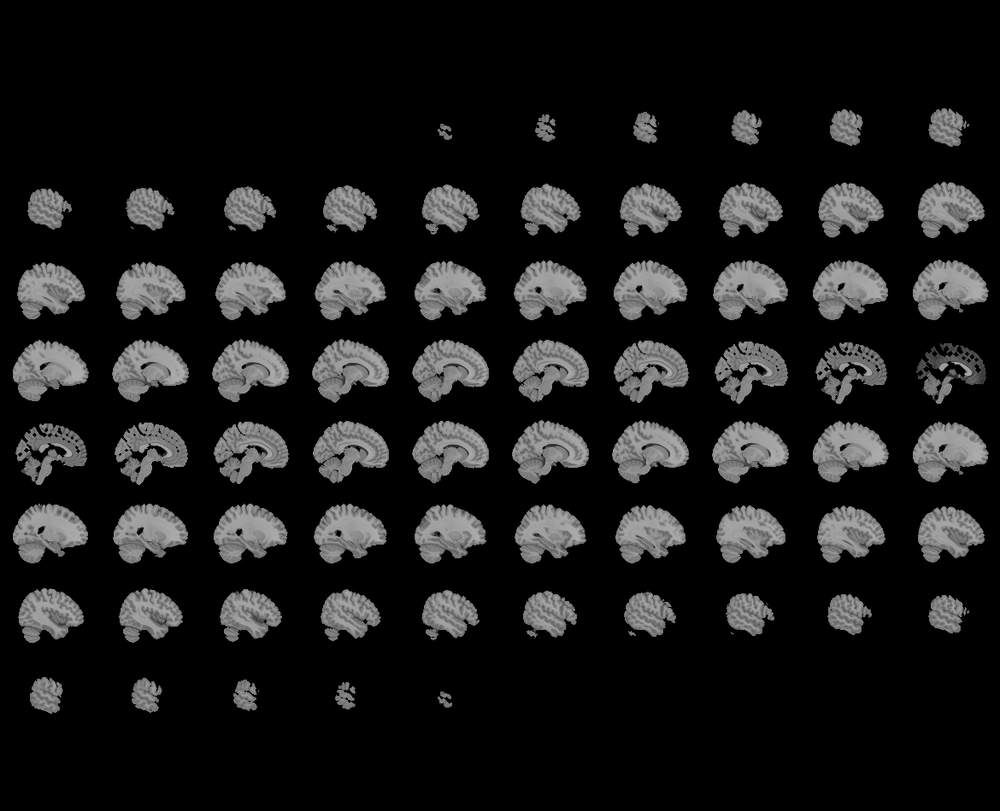
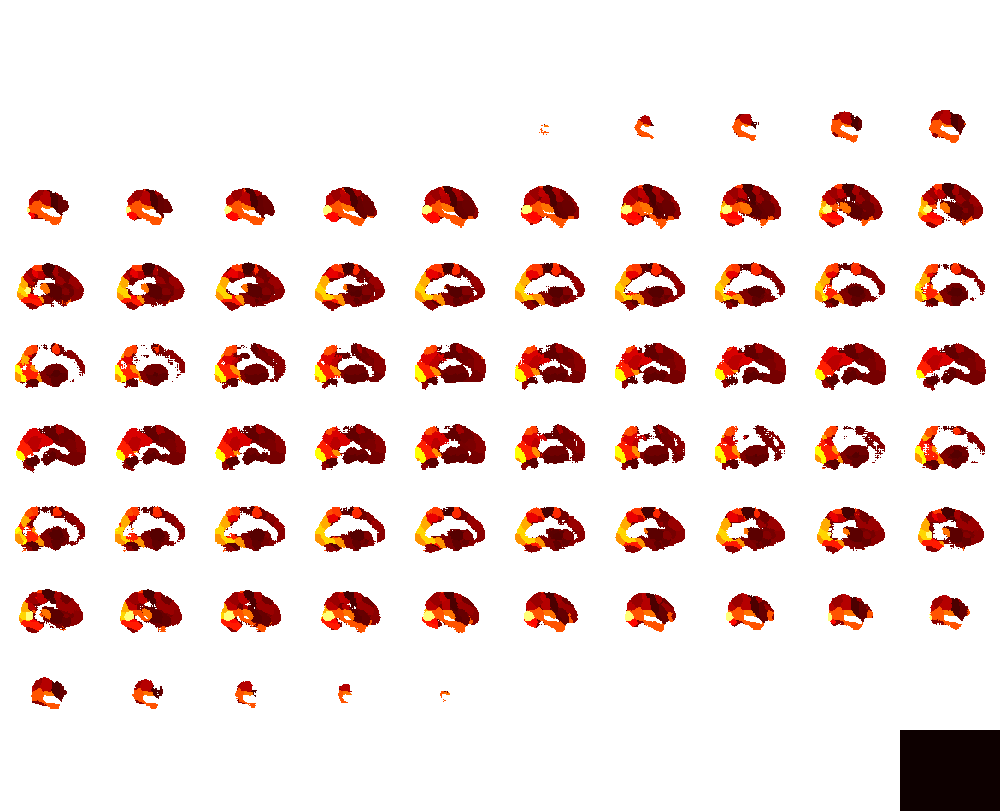

In [33]:
view_img(isc_r_brain.to_nifti())

We can threshold using bonferroni correction (p < 0.001 for k=50 parcellation). Alternatively, we can threshold using false discovery rate, by setting `thr=fdr(isc_p_brain.data)`. In this example, FDR is more conservative than bonferroni. 

In [34]:
view_img_on_surf(threshold(isc_r_brain, isc_p_brain, thr=.001).to_nifti())

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:756: FutureWarning: Image data has type int64, which may cause incompatibilities with other tools. This will error in NiBabel 5.0. This warning can be silenced by passing the dtype argument to Nifti1Image().
  return klass(data, affine, header=header)


## Temporal dynamics of intersubject synchrony
The majority of research has focused on correlations calculated over entire datasets to reveal the average connectivity or intersubject similarity in a group of participants. However, functional brain networks are widely thought to be *dynamic*. Thus, it is not clear whether tools like correlation, which assumes a constant statistical dependence between the variables over the entire imaging session, are the most appropriate way to analyze data gathered during complex naturalistic stimulation.

A simple, and popular way of looking at temporal variability of synchrony while limiting the effects of signal amplitudes is to calculate correlations within sliding time windows. This allows the estimation of synchrony also during time windows when the signals are close to their mean values as the amplitude within each time window is standardized when the correlation is calculated. However, the length of the temporal window forces a trade-off between temporal accuracy and stability of the correlation coefficient calculated in that window. Very short time windows allow one to follow precisely when correlations occur, but short windows yield extremely unstable correlations, which can be dominated completely by e.g. single co-occurring spikes or slopes. Thus, sliding-window correlations in short time-windows are often characterized by extreme correlation values that change signs wildly.

Calculating the phase synchronization or phase locking of signals is one option to estimate time-varying synchronization of signals in a way that largely separates synchronization from signal amplitudes. It has been used widely for electrophysiological measures such as EEG and MEG, and more recently also for fMRI ([Glerean et al., 2012](https://www.liebertpub.com/doi/pdfplus/10.1089/brain.2011.0068)). Phase synchronization leverages the Hilbert transform to transform the real-valued signals into a complex valued, analytic signal, which is a generalization of the phasor notation of sinusoidal signals that are used widely in engineering applications. 

For illustration, two examples of analytic signals with constant frequency and amplitude are shown in the bottom panel of the animation, plotted in three dimensions (real, imaginary and time axes). We have used the cosine of the angular difference as a measure of pairwise synchrony. This produces time-averaged values that are consistent with the ISCs in the regions. In contrast to a time-invariant phasor, an analytic signal has a time-varying amplitude envelope and frequency and can thus be used to track changes in synchrony over time. However, for meaningful separation of the envelope and phase of the signal, the original signal has to be contained in a limited frequency band, which can be obtained through band-pass filtering. The smaller this frequency band is, the better the amplitude envelope is separated into a lower frequency than the phase of the signal in the pass-band ([Glerean et al., 2012](https://www.liebertpub.com/doi/pdfplus/10.1089/brain.2011.0068)). However, poorly designed filters may affect the shape of the signal considerably and in extreme cases even remove the signal of interest. For example, some filters can cause non-linear phase shifts across the frequency spectrum, or excessively tight pass-band may miss important frequencies completely.

![phase_synchrony](../images/isc/PhaseSynchronyAndCorrelation.gif)

Compared to sliding-window correlations, phase synchronization has the benefit that no explicit time windowing is required and synchronization is estimated at the original sampling frequency of the signals (though you still do need to choose a specific narrow frequency band). However, in a single pairwise comparison, phase synchrony can get extreme values by chance, much like a stopped clock that shows the right time twice a day. This is illustrated in the bottom panel of the animation. Despite the two signals being independent, the histogram on the left shows that many of the time points have extreme synchrony values. Accordingly, the estimate of mean synchrony oscillates with the phase of the signals, until eventually stabilizing around zero as expected for independent signals. Thus, phase synchrony of two signals has the potential of producing extreme synchrony values much like time windowed correlations. This can be mitigated by averaging. Averaging over the timepoints of a full session, intersubject phase synchronization (ISPS) of regional activity produces highly similar group-level results to ISC. However, this removes the benefit of the temporal accuracy of ISPS and is thus of limited use. By contrast, averaging over (pairs of) subjects improves the reliability of synchrony in a larger population while retaining the temporal accuracy.



### Intersubject Phase Synchrony Tutorial

Now, let's start working through some code to build an intuition for the core concepts behind intersubject phase synchrony (ISPS). We will begin by creating an animation of the phase angles.

First, we need to compute the instantaneous phase angle of our average ROI activity for each subject. We will use an infinite impulse response (IIR) bandpass butterworth filter. This requires specifying the **sampling_frequency** in cycles per second (i.e., Hz), which is $\frac{1}{tr}$, and lower and upper cutoff frequencies also in Hz. We will then apply a **hilbert** transform and extract the **phase angle** for each time point.

Let's extract signal from primary auditory cortex, which we can assume will synchronize strongly across participants (roi=35) and use a lower bound cutoff frequency of 0.04Hz and an upper bound of 0.07Hz as recommended by ([Glerean et al., 2012](https://www.liebertpub.com/doi/pdfplus/10.1089/brain.2011.0068)).

To visualize the data, we will plot 100 TRs of each participant's phase angles from the auditory cortex using a polar plot. Notice that for some time points all subjects have a different phase angle. These time points should have low synchrony values (i.e., resultant vector length close to zero). Other time points the phase angles will cluster together and all face the same direction. These time points will have high phase synchrony (i.e.,  resultant vector length close to one). We can also compute the mean phase angle for the group using circular statistics (red line). We don't actually care so much about the mean angle, but rather the **length of the resultant vector**. The resultant vector length is our metric of intersubject phase clustering, or the degree to which participants are in phase with each other at a given time point. Notice how the length gets shorter the more participants are out of phase and longer when they are all facing the same direction.


In [64]:
roi = 35
tr = 2
lowcut = .04
highcut = .07

phase_angles = np.angle(hilbert(_butter_bandpass_filter(get_subject_roi(sub_timeseries, roi), lowcut, highcut, 1/tr), axis=0))

xs, ys = [], []

fig = plt.figure(constrained_layout=False, figsize=(10,10))
spec = gridspec.GridSpec(ncols=4, nrows=4, figure=fig)

a0 = fig.add_subplot(spec[:2, :2], projection='polar')
plt.polar([0, _phase_mean_angle(phase_angles[0,:])], [0,1], color='red', linewidth=3)

a1 = fig.add_subplot(spec[:2, 2:4], projection='polar')
plt.polar([0, phase_angles[0,0]], [0,1], color='navy', linewidth=1, alpha=.2)

a2 = fig.add_subplot(spec[2:, :])
a2.plot(_phase_vector_length(phase_angles))
a2.set_ylabel('Phase Synchrony', fontsize=18)
a2.set_xlabel('Time (TRs)', fontsize=18)

def animate(i, xs, ys):
    xs = np.linspace(0, i, i+1, endpoint=True)
    ys = phase_angles[:i+1, :]
    
    a0.clear()
    a0.plot([0, _phase_mean_angle(phase_angles[i,:])], [0, _phase_vector_length(phase_angles[i,:])], color='red', linewidth=3)
    a0.set_title('Mean Phase Angle', fontsize=18)
    a0.set_ylim([0,1])
    
    a1.clear()
    for j in range(ys.shape[1]):
        a1.plot([0, phase_angles[i,j]], [0,1], color='navy', alpha=.5)  
    a1.set_title('Subject Phase Angles', fontsize=18)

    a2.clear()
    a2.plot(xs, _phase_vector_length(ys))
    a2.set_ylim([0,1])
    a2.set_ylabel('Resultant Vector Length', fontsize=18)
    a2.set_xlabel('Time (TRs)', fontsize=18)
    a2.set_title('Intersubject Phase Synchrony', fontsize=18)
    plt.tight_layout()
    
animation = FuncAnimation(fig, animate, fargs=(xs, ys), frames=range(100,200), interval=150, blit=False)
plt.close(animation._fig)
HTML(animation.to_jshtml())


Animation size has reached 20990744 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


In [62]:
FuncAnimation?

Ok, now that we have a better understanding of our measure of ISPS, let's pick a frequency band and plot the average phase synchrony over the entire 50min Sherlock viewing within each ROI from our parcellation. Let's continue using a lower bound cutoff frequency of 0.04Hz and an upper bound of 0.07Hz as recommended by ([Glerean et al., 2012](https://www.liebertpub.com/doi/pdfplus/10.1089/brain.2011.0068)).

In this example, we loop over each ROI and compute average ISPS over time and then project back into brain space.

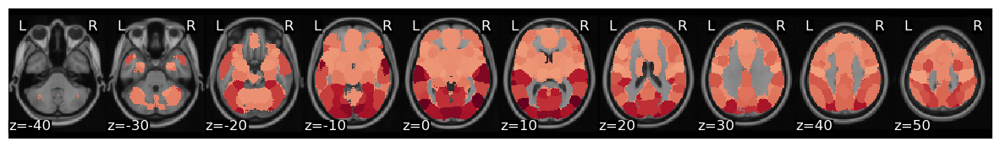

In [40]:
cutoff = (0.04, 0.07)
synchrony = {}
for roi in range(50):
    synchrony[roi] = isps(get_subject_roi(sub_timeseries, roi), low_cut=cutoff[0], high_cut=cutoff[1], sampling_freq=1/tr, order=5)['vector_length']
synchrony = pd.DataFrame(synchrony)

phase_synchrony_brain = roi_to_brain(pd.DataFrame(synchrony).mean(), mask_x)
phase_synchrony_brain.plot(cmap='RdBu_r')

Let's also create an interactive surface rendering. As you can see, these results look very similar to the whole timeseries ISC approach we used above. High overall synchrony across participants within primary auditory and visual cortices and lower overall synchrony in prefrontal and limbic regions.

In [41]:
view_img_on_surf(phase_synchrony_brain.to_nifti())

### Time - Frequency

In the previous example, we only looked at a specific frequency band (0.04-0.07Hz). It's possible that participants might differentially synchronize within different frequency bands ([Honey et al., 2012](https://www.sciencedirect.com/science/article/pii/S0896627312007179), [Kauppi et al., 2010](https://scholar.google.com/scholar?hl=en&as_sdt=0%2C30&q=kauppi+tohka&btnG=)). Let's create a *time-frequency* plot to see how ISPS changes over time within different frequency for a given ROI. Let's start by exploring the dorsomedial prefrontal cortex (dmPFC; roi=2), but feel free to explore different ROIs by changing the value of the variable.

We will loop over different cutoff bands. These are based on the slow frequency bands described in ([Buszaki & Draguhun, 2003](https://science.sciencemag.org/content/304/5679/1926) and [Zuo et al., 2010](https://www.sciencedirect.com/science/article/pii/S1053811909010167)), but are admittedly somewhat arbitrarily selected. Feel free to play around with the cutoffs if you're interested. Brighter colors indicate time points that have a higher level of ISPS within a specific TR. 

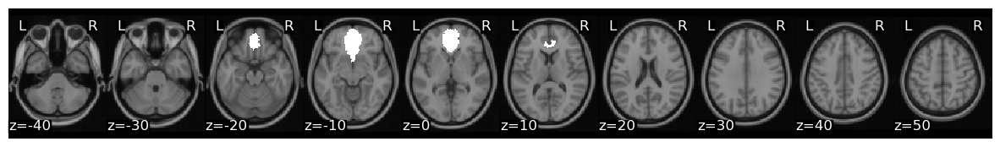

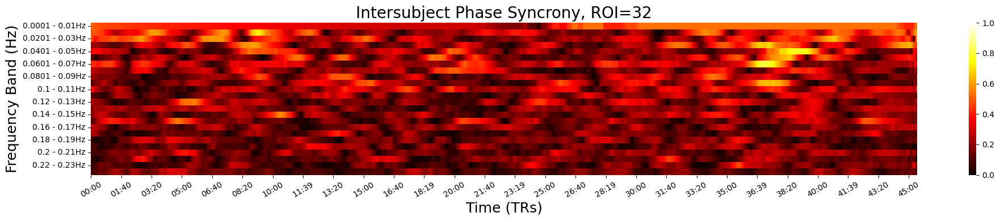

In [162]:
tr = 2
roi = 32


# Create 25 linearly spaced Frequency Bins
frequencies = [] 
for i,f in enumerate(np.linspace(.0001, .24, 25)):
    if i > 0:
        frequencies.append(tuple([prev_f, f]))
    prev_f = f

# Compute ISPS for each Frequency
time_freq = {}
for i,cutoff in enumerate(frequencies):
    time_freq[i] = isps(get_subject_roi(sub_timeseries, roi), low_cut=cutoff[0], high_cut=cutoff[1], sampling_freq=1/tr, order=5)['vector_length']

# Label Frequencies
time_freq = pd.DataFrame(time_freq).T
time_freq.index = [f'{f[0]:.03} - {f[1]:.02}Hz' for f in frequencies]

# Plot ROI
mask_x[roi].plot()
f,a = plt.subplots(nrows=1, figsize=(20, 4))

# Plot Heatmap
sns.heatmap(time_freq, cmap='hot', vmin=0, vmax=1, xticklabels=False, ax=a)
a.set_title(f'Intersubject Phase Syncrony, ROI={roi}', fontsize=20)
a.set_ylabel('Frequency Band (Hz)', fontsize=18)
a.set_xlabel('Time (TRs)', fontsize=18)
a.set_xticks(range(0, time_freq.shape[1],50))
a.set_xticklabels(rec_to_time(range(0,time_freq.shape[1],50), TR=tr), rotation=30)
plt.tight_layout()



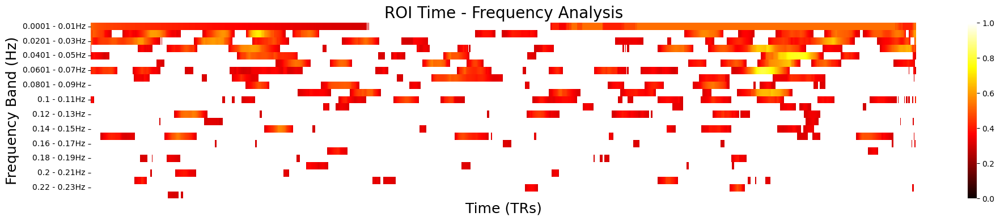

In [163]:
time_freq_thresh = time_freq.copy()
time_freq_thresh[time_freq_thresh < r_threshold] = np.nan

f,a = plt.subplots(nrows=1, figsize=(20, 4))
sns.heatmap(time_freq_thresh, cmap='hot', vmin=0, vmax=1, xticklabels=False, ax=a)
a.set_title('ROI Time - Frequency Analysis', fontsize=20)
a.set_ylabel('Frequency Band (Hz)', fontsize=18)
a.set_xlabel('Time (TRs)', fontsize=18)
plt.tight_layout()

### Hypothesis Tests


Statistics for time-varying measures of synchrony largely follow a similar non-parametric approach as discussed above. However, depending on the values that are used, statistics of phase synchrony differ slightly from linear measures of synchrony. In particular, [circular statistics](https://en.wikipedia.org/wiki/Directional_statistics) ([Fisher, 1995](https://books.google.com/books?hl=en&lr=&id=wGPj3EoFdJwC&oi=fnd&pg=PA1&dq=fisher+circular+statistics&ots=Pk3qBtzDPd&sig=nKKDV_lB6-DjqMipIm5EF2OzWeQ#v=onepage&q=fisher%20circular%20statistics&f=false)) can be used to estimate the parametric statistics of phase differences on the unit circle, as wrapping of the phase angle causes the angular difference to change signs as the signals rotate around the circle. 

For a parametric test, we can use the [Rayleigh test](https://en.wikipedia.org/wiki/Rayleigh_test) to determine if the intersubject phase angle synchrony is statistically significant, by testing the null hypothesis that the phase angles are uniformly distributed around a circle ([Fisher, 1995](https://books.google.com/books?hl=en&lr=&id=wGPj3EoFdJwC&oi=fnd&pg=PA1&dq=fisher+circular+statistics&ots=Pk3qBtzDPd&sig=nKKDV_lB6-DjqMipIm5EF2OzWeQ#v=onepage&q=fisher%20circular%20statistics&f=false)). If the phase angles cluster together in specific direction, they will have a large resultant vector and we can reject the null uniformity hypothesis.

Let's simulate what intersubject synchrony values would be significant at p < 0.05 given the sample size of N=16 in the Sherlock dataset. Here we plot the estimated p-values using the Rayleigh test across ISPS values ranging from $[0,1]$.

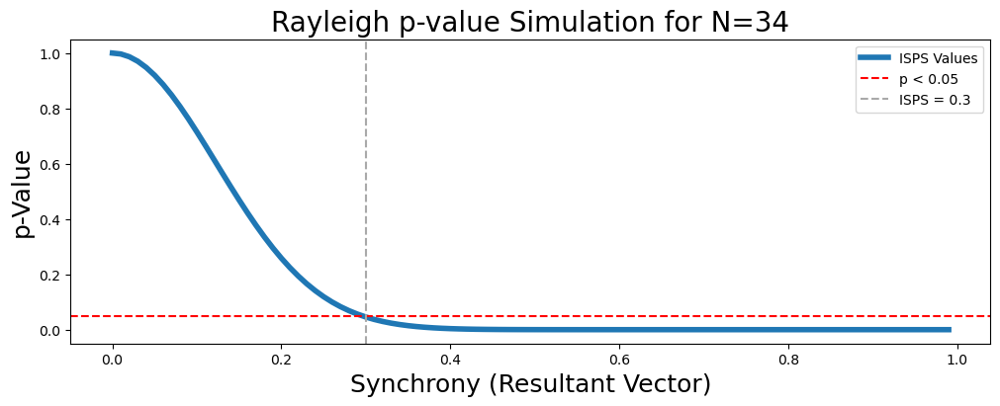

In [142]:
n = len(sub_list)
R = np.arange(0,1, .01)
Z = n*(R**2)

p = np.exp(-1*Z)*(1 + (2*Z - Z**2)/(4*n) - (24*Z - 132*Z**2 +76*Z**3 - 9*Z**4)/(288*n**2))
r_threshold = R[np.min(np.where(p<0.05)[0])]

plt.figure(figsize=(12, 4))
plt.plot(R, p, linewidth=4)
plt.axhline(.05, linestyle='--', color='red')
plt.axvline(r_threshold, linestyle='--', color='darkgrey')
plt.ylabel('p-Value', fontsize=18)
plt.xlabel('Synchrony (Resultant Vector)', fontsize=18)
plt.title(f'Rayleigh p-value Simulation for N={len(sub_list)}', fontsize=20)
plt.legend(['ISPS Values', 'p < 0.05', f'ISPS = {r_threshold}'])

As you can see, for an N of 16, an ISPS value of 0.3 corresponds to a significance value of approximately p < 0.05. This number will decrease as the number of participants increases and approaches the central limit theorem like any significance test. 

Note: just like all significance tests, you will need to consider controlling for multiple comparisons when repeated testing the same hypothesis across either space or time. 

Now, let's put this all together and compute ISPS at different frequency bands thresholding at a very liberal threshold of p < 0.05.

/Users/lukechang/opt/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:383: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


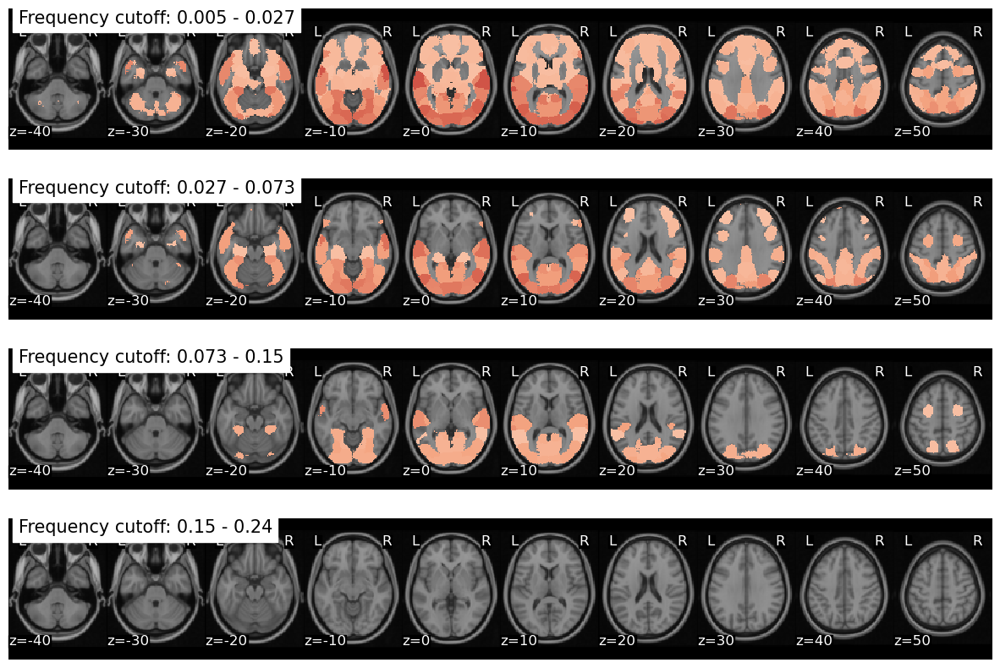

In [70]:
f,a = plt.subplots(nrows = len(frequencies), figsize=(15,10))
for i,cutoff in enumerate(frequencies):
    synchrony = {}
    for roi in range(50):
        synchrony[roi] = isps(get_subject_roi(sub_timeseries, roi), low_cut=cutoff[0], high_cut=cutoff[1], sampling_freq=1/tr, order=5)['vector_length']
    phase_synchrony_brain = roi_to_brain(pd.DataFrame(synchrony).mean(), mask_x)
    phase_synchrony_brain.plot(cmap='RdBu_r', vmax=1, axes=a[i], threshold=r_threshold, title=f"Frequency cutoff: {cutoff[0]} - {cutoff[1]}")


Interestingly, similar to previous work ([Kauppi et al., 2010](https://scholar.google.com/scholar?hl=en&as_sdt=0%2C30&q=kauppi+tohka&btnG=)), we find not a lot of consistency at very fast frequencies (at least for fMRI), stronger ISPS in primary sensory regions including early visual and auditory, and a hint of higher ISPS spreading across more areas of cortex including lateral OFC and dmPFC at slower frequencies.

# Functional Alignment
*Written by Luke Chang*

One of the main goals of cognitive neuroscience is to understand how the brain represents and processes information about the external world, integrates it with internal goals and previous experiences, and produces actions. An implicit assumption in almost all neuroimaging studies is that each person's brain processes information in the same way as other people's brains. In neuroimaging research we have acknowledged that there is wide variation in individual neuroanatomy, and a key preprocessing step is to normalize each participant into a common stereotactic space. We also know that these algorithms are not perfect and that applying a small amount of local Gaussian smoothing can help mitigate small misalignments and increase voxel signal to noise ratios. While these techniques appear to work reasonably well when performing mass univariate testing, they may have some limitations when using multivariate techniques. For example, multivariate models such as prediction/classification and representational similarity analysis assume that the features of the model (e.g., voxels) are aligned across participants and that patterned variations within these features reflect information processing. 

There has been growing interest in developing new algorithms to project subjects into a common space based on how a voxels respond to stimuli ([Haxby et al., 2011](https://www.sciencedirect.com/science/article/pii/S0896627311007811) ; [Guntupalli et al., 2016](https://academic.oup.com/cercor/article/26/6/2919/1754308)) or are connected to other voxels ([Guntupalli, et al., 2018](https://journals.plos.org/ploscompbiol/article?rev=1&id=10.1371/journal.pcbi.1006120)). These efforts have been largely lead by [Jim Haxby](http://haxbylab.dartmouth.edu/index.html) and [Peter Ramadge's](https://ee.princeton.edu/people/peter-j-ramadge) research groups over the past decade and are generally referred to as *hyperalignment*, or *functional alignment*. 

The basic idea behind hyperalignment is to treat cortical patterns as vectors corresponding to locations in a high dimensional space, where each axis reflects a measurement of that pattern (e.g., voxel activity) ([Haxby, 2014](https://www.annualreviews.org/doi/abs/10.1146/annurev-neuro-062012-170325)). Thus, rather than treating cortical functions in a 1D (average roi activity), 2D (cortical sheet), or 3D physical space, hyperalignment models information as being embedded in an n-dimensional space, where n reflects the number of measurements (e.g., voxels). Vector representations of cortical patterns can then be transformed into a common high dimensional space that is shared across participants. This idea of transforming individual cortical patterns into a common high dimensional model space can be seen in the following figure from ([Haxby et al., 2020](https://elifesciences.org/articles/56601)).

![hyperalignment](../images/hyperalignment/elife-56601-fig1-v1.jpg)

There are many different models of functional alignment. *Response-based hyperalignment* uses an iterative procrustes transform to scale, rotate, and reflect voxel time series so that they are in the same functional space across participants ([Haxby et al., 2011](https://www.sciencedirect.com/science/article/pii/S0896627311007811) ; [Guntupalli et al., 2016](https://academic.oup.com/cercor/article/26/6/2919/1754308)). *Connectivity-based hyperalignment* instead aligns voxels based on their embedding with other voxels using seed-based functional connectivity ([Guntupalli, et al., 2018](https://journals.plos.org/ploscompbiol/article?rev=1&id=10.1371/journal.pcbi.1006120)). There is also another approach called the *Shared Response Model*, which learns a joint-SVD and can project subjects into a lower dimensional common space ([Chen et al., 2014](https://ieeexplore.ieee.org/abstract/document/6958912), [Chen et al., 2015](http://papers.nips.cc/paper/5855-a-reduced-dimension-fmri-shared-response-model.pdf)). Overall, it has been shown that all of these different approaches can dramatically improve between subject classification accuracy particularly in [ventral temporal cortex](http://haxbylab.dartmouth.edu/publications/HGC+11.pdf). In addition, lower dimensional projections removes redundant axes in the high dimensional space and can effectively denoise the signal, which also improves classification accuracy. 

Hyperalignment was developed at Dartmouth College and is implemented in the [PyMVPA](http://www.pymvpa.org) toolbox. There is a [tutorial](http://www.pymvpa.org/examples/hyperalignment.html) on the PyMVPA website for how to implement different versions of hyperalignment. The Shared Response Model was developed at Princeton University and is implemented in the [brainiak](https://brainiak.org/) toolbox and I also encourage you to see their excellent [tutorial](https://brainiak.org/tutorials/11-SRM/).

In this tutorial, we will walk through how to perform Response-Based Hyperalignment and the Shared Response model on the Sherlock dataset using the [nltools](https://neurolearn.readthedocs.io/en/latest/) toolbox.

Before we get started, I encourage you to watch this video by [Dr. James Haxby, PhD](http://haxbylab.dartmouth.edu/ppl/jim.html) from the [2018 MIND Computational Summer School](http://mindsummerschool.org/) in which he discusses how hyperalignment can be used to model the shared deep structure of information encoded in fine-scale cortical topographies. This video is about an hour long and provides an excellent overview of hyperalignment. 

In [ ]:
## Shared Response Model (SRM)
Now let's try aligning the data using the shared response model. The shared response model allows for the possibility of aligning in a lower dimensional functional space. Here we provide an example of aligning to a 100 dimensional features space. Previous work has found that this can potentially improve generalizability of multivariate models trained on an ROI compared to using as many features as voxels. This feature is not yet implemented for procrustes transformation as dimensionality reduction would need to happen either before or after alignment. The processing time increases with the number of dimensions, 100 components takes about 15 seconds. We will zscore the data before training the model.

In [ ]:
all_data_z = [x.standardize(method='zscore') for x in all_data]
srm = align(all_data_z, method='deterministic_srm', n_features=100)

### Plot Aligned Latent Component Time Course
Unlike hyperalignment, which is providing a linear projection of all voxels, the shared response model is learning a common latent space and the overall dimensionality is limited to the number of observations. In this example, there are more voxels (n=2786) in the early visual anatomical mask relative to the number of observed TRs (n=1030). This means the maximum number of components we can estimate is 1030. We chose to train a model with a lower dimensional space with only 100 components.

This means we cannot directly compare the SRM with the original voxels. Here we are simply plotting the average time course of a single randomly selected component.

In [ ]:
component_index = 0

component_aligned = pd.DataFrame([x[:, component_index] for x in srm['transformed']]).T

f, a = plt.subplots(nrows=1, figsize=(15, 5), sharex=True)
a.plot(component_aligned, linestyle='-', alpha=.2)
a.plot(np.mean(component_aligned, axis=1), linestyle='-', color='navy')
a.set_ylabel('Aligned Component', fontsize=16)
a.yaxis.set_ticks([])

plt.xlabel('Component Time Course (TRs)', fontsize=16)
a.set_title(f"Aligned Component ISC: r={Adjacency(component_aligned.corr(), matrix_type='similarity').mean():.02}", fontsize=18)


In [ ]:
plt.hist(srm['isc'].values())
plt.axvline(x=np.mean(list(srm['isc'].values())), linestyle='--', color='red', linewidth=2)
plt.ylabel('Frequency', fontsize=16)
plt.xlabel('Voxel ISC Values', fontsize=16)
plt.title('Shared Response Model ISC', fontsize=18)

### Plot Subject Spatial Patterns associated with each latent component
SRM learns a unique projection for each subject into a common latent time course. The maximum number of latent timecourses that can be estimated is equal or less than the number of observations (i.e., TRs). Here we are reducing the voxel space into a lower dimensional 100 components. This may seem obvious, but a consequence of this lower dimensional projection is that we can no longer maintain a "voxel" level representation so we are unable to generate the same figure depicting how the cortical topographies change. Instead we will plot the weights that project each subject's data into a common latent time course. Feel free to change the component number to see how each subjects pattern that projects into the common time course.

In [ ]:
component = 3

f = plt.figure(constrained_layout=True, figsize=(12,8))
spec = gridspec.GridSpec(ncols=4, nrows=4, figure=f)
for i in range(4):
    a0 = f.add_subplot(spec[i, 0])
    a0.imshow(np.rot90(srm['transformation_matrix'][i][component].to_nifti().dataobj[30:60, 10:28, 37]),cmap='RdBu_r')
    a0.set_ylabel(f'Subject {i+1}', fontsize=18)
    a0.yaxis.set_ticks([])
    a0.xaxis.set_visible(False)    
    
    a1 = f.add_subplot(spec[i, 1:])
    a1.plot(srm['transformed'][i][:,component])
    a1.xaxis.set_visible(False)
    a1.yaxis.set_visible(False)

    if i < 1:
        a0.set_title('Spatial Pattern', fontsize=20)
        a1.set_title('Latent Timecourse', fontsize=20)


## Align new subject to common model
We can align new subjects into the common model without retraining the entire model. Here we individually align subject 16, who was left out of the original training to the common space learned above using hyperalignment.  

In [ ]:
new_data = all_data[-1]

new_data[0].plot()

In [ ]:
aligned_sub_hyperalignment = new_data.align(hyperalign['common_model'], method='procrustes')

aligned_sub_hyperalignment['transformed'][0].plot()

You can see that the pattern of cortical activation has now changed after projecting this subject into the common space using hyperalignment.

We can also project subject 16 into the SRM common space. Don't forget we also need to z-score this subject's data to be consistent with how the model was trained.

In [ ]:
aligned_sub_srm = new_data.standardize(method='zscore').align(srm['common_model'], method='deterministic_srm')

In [ ]:
aligned_sub_srm['transformation_matrix'][0].plot()

## Cross-Validation - Project New Subject Data into Common Space
Because the functional alignment models were trained to maximize ISC, the ISC values are biased and will likely be inflated. As with all machine learning algorithms, it is important to evaluate how well the model works on independent data. If you have lots of data from each subject, you can a priori divide some of it into training and test. If you don't have lots of data, you can perform cross-validation to approximate how well your model will perform on new data.

The basic idea is to use the learned subject-specific transformation matrices to project new independent data from that participant into the common space.

In this tutorial, we will project Part1 Sherlock data into common space using Part2 data.

Let's load the Part1 data and overwrite the Part2 data to save RAM.


In [ ]:
scan = 'Part1'
roi = 4

roi_mask = mask_x[roi]

file_list = glob.glob(os.path.join(data_dir, 'fmriprep', '*', 'func', f'*crop*{scan}*hdf5'))
all_data = []
for f in file_list:
    sub = os.path.basename(f).split('_')[0]
    print(sub)
    data = Brain_Data(f)
    all_data.append(data.apply_mask(roi_mask))

Ok, now let's start by projecting subject 16's Part1 data into the common space. First, we will create a copy of subject 16's data variable. Then, we will grab the transformation matrix from the alignment dictionary. This is a Brain_Data object, so we will need to grab the data from the `.data` attribute. We will use `np.dot()` to perform a simple inner matrix multiplication to project the data into the common space using the subject's transformation matrix learned from Part2.

In [ ]:
s16_pt1_hyp_transformed = all_data[-1].copy()

s16_pt1_hyp_transformed.data = np.dot(s16_pt1_hyp_transformed.data, aligned_sub_hyperalignment['transformation_matrix'].data.T)

s16_pt1_hyp_transformed

We can easily do this for the rest of the participants by looping over the data.

In [ ]:
hyperalign_transformed = []
for i,x in enumerate(all_data[:15]):
    new_x = x.copy()
    new_x.data = np.dot(x.data, hyperalign['transformation_matrix'][i].data.T)
    hyperalign_transformed.append(new_x)

Projecting data into the common space using SRM is essentially the same code, but even simpler because it is just working with numpy arrays. Don't forget to z-score the data again.

In [ ]:
s16_pt1_srm_transformed = all_data[-1].copy().standardize(method='zscore')

s16_pt1_srm_transformed = np.dot(s16_pt1_srm_transformed.data, aligned_sub_srm['transformation_matrix'].data.T)

s16_pt1_srm_transformed.shape

In [ ]:
srm_transformed = []
for i,x in enumerate(all_data[:15]):
    srm_transformed.append(np.dot(x.standardize(method='zscore').data, srm['transformation_matrix'][i].data.T))

## Recommended reading
### Intersubject Synchrony

* Glerean, E., Salmi, J., Lahnakoski, J. M., Jääskeläinen, I. P., and Sams, M. (2012). Functional Magnetic Resonance Imaging Phase Synchronization as a Measure of Dynamic Functional Connectivity. Brain Connect. 2, 91–101. doi:10.1089/brain.2011.0068.

* Nastase, S. A., Gazzola, V., Hasson, U., & Keysers, C. (2019). Measuring shared responses across subjects using intersubject correlation. Social Cognitive and Affective Neuroscience, Volume 14, Issue 6, June 2019, Pages 667–685, https://doi.org/10.1093/scan/nsz037

* Nummenmaa, L., Lahnakoski, J. M., and Glerean, E. (2018). Sharing the social world via intersubject neural synchronisation. Curr. Opin. Psychol. 24. doi:10.1016/j.copsyc.2018.02.021.

* Simony, E., Honey, C. J., Chen, J., Lositsky, O., Yeshurun, Y., Wiesel, A., et al. (2016). Dynamic reconfiguration of the default mode network during narrative comprehension. Nat. Commun. 7. doi:10.1038/ncomms12141.

### Functional Alignment

* Haxby, J. V., Guntupalli, J. S., Nastase, S. A., & Feilong, M. (2020). Hyperalignment: Modeling shared information encoded in idiosyncratic cortical topographies. Elife, 9, e56601.


* Cohen, J. D., Daw, N., Engelhardt, B., Hasson, U., Li, K., Niv, Y., ... & Willke, T. L. (2017). Computational approaches to fMRI analysis. Nature neuroscience, 20(3), 304.


* Chen, P. H. C., Chen, J., Yeshurun, Y., Hasson, U., Haxby, J., & Ramadge, P. J. (2015). A reduced-dimension fMRI shared response model. In Advances in Neural Information Processing Systems (pp. 460-468).


* Guntupalli, J. S., Hanke, M., Halchenko, Y. O., Connolly, A. C., Ramadge, P. J., & Haxby, J. V. (2016). A model of representational spaces in human cortex. Cerebral cortex, 26(6), 2919-2934.


## Contributions

Juha Lahnakoski wrote text, Luke Chang wrote text and developed the practical tutorials.
